![](https://img.shields.io/badge/PO.DAAC-Contribution-%20?color=grey&labelColor=blue)

> From the PO.DAAC Cookbook, to access the GitHub version of the notebook, follow [this link](https://github.com/podaac/tutorials/blob/master/notebooks/datasets/SWOTHR_localmachine.ipynb). 

# SWOT Hydrology Dataset Exploration on a local machine

## Accessing and Visualizing SWOT Datasets

### Requirement:
Local compute environment e.g. laptop, server: this tutorial can be run on your local machine.

### Learning Objectives:
- Access SWOT HR data products (archived in NASA Earthdata Cloud) by downloading to local machine
- Visualize accessed data for a quick check

#### SWOT Level 2 KaRIn High Rate Version 2.0 Datasets:

1. **River Vector Shapefile** - SWOT_L2_HR_RIVERSP_2.0

2. **Lake Vector Shapefile** - SWOT_L2_HR_LAKESP_2.0

3. **Water Mask Pixel Cloud NetCDF** - SWOT_L2_HR_PIXC_2.0

4. **Water Mask Pixel Cloud Vector Attribute NetCDF** - SWOT_L2_HR_PIXCVec_2.0

5. **Raster NetCDF** - SWOT_L2_HR_Raster_2.0

6. **Single Look Complex Data product** - SWOT_L1B_HR_SLC_2.0

_Notebook Author: Cassie Nickles, NASA PO.DAAC (Feb 2024) || Other Contributors: Zoe Walschots (PO.DAAC Summer Intern 2023), Catalina Taglialatela (NASA PO.DAAC), Luis Lopez (NASA NSIDC DAAC), Brent Williams (NASA JPL)_

_Last updated: 9 July 2024_
  

### Libraries Needed

In [2]:
import glob
import h5netcdf
import xarray as xr
import pandas as pd
import geopandas as gpd
import contextily as cx
import numpy as np
import matplotlib.pyplot as plt
import hvplot.xarray
import zipfile
import earthaccess

### Earthdata Login

An Earthdata Login account is required to access data, as well as discover restricted data, from the NASA Earthdata system. Thus, to access NASA data, you need Earthdata Login. If you don't already have one, please visit https://urs.earthdata.nasa.gov to register and manage your Earthdata Login account. This account is free to create and only takes a moment to set up. We use `earthaccess` to authenticate your login credentials below.

In [3]:
auth = earthaccess.login()

### Single File Access

#### **1. River Vector Shapefiles**

The https access link can be found using `earthaccess` data search. Since this collection consists of Reach and Node files, we need to extract only the granule for the Reach file. We do this by filtering for the 'Reach' title in the data link.

Alternatively, Earthdata Search [(see tutorial)](https://nasa-openscapes.github.io/2021-Cloud-Workshop-AGU/tutorials/01_Earthdata_Search.html) can be used to manually search in a GUI interface.

For additional tips on spatial searching of SWOT HR L2 data, see also [PO.DAAC Cookbook - SWOT Chapter tips section](https://podaac.github.io/tutorials/quarto_text/SWOT.html#tips-for-swot-hr-spatial-search).

#### Search for the data of interest

In [9]:
#Retrieves granule from the day we want, in this case by passing to `earthdata.search_data` function the data collection shortname, temporal bounds, and filter by wildcards
river_results = earthaccess.search_data(short_name = 'SWOT_L2_HR_RIVERSP_2.0', 
                                        temporal = ('2024-02-01 00:00:00', '2024-05-29 23:59:59'), # can also specify by time
                                        granule_name = '*Reach*_009_NA*') # here we filter by Reach files (not node), pass=009, continent code=NA

Granules found: 6


#### Dowload, unzip, read the data

Let's download the first data file! `earthaccess.download` has a list as the input format, so we need to put brackets around the single file we pass.

In [10]:
earthaccess.download([river_results[0]], "./data_downloads")

 Getting 1 granules, approx download size: 0.01 GB


QUEUEING TASKS | : 100%|██████████| 1/1 [00:00<00:00, 250.20it/s]
PROCESSING TASKS | : 100%|██████████| 1/1 [00:04<00:00,  4.37s/it]
COLLECTING RESULTS | : 100%|██████████| 1/1 [00:00<?, ?it/s]


['data_downloads\\SWOT_L2_HR_RiverSP_Reach_011_009_NA_20240215T042656_20240215T042707_PIC0_01.zip']

The native format for this data is a .zip file, and we want the .shp file within the .zip file, so we must first extract the data to open it. First, we'll programmatically get the filename we just downloaded, and then extract all data to the `data_downloads` folder.

In [11]:
filename = earthaccess.results.DataGranule.data_links(river_results[0], access='external')
filename = filename[0].split("/")[-1]
filename

'SWOT_L2_HR_RiverSP_Reach_011_009_NA_20240215T042656_20240215T042707_PIC0_01.zip'

In [12]:
with zipfile.ZipFile(f'data_downloads/{filename}', 'r') as zip_ref:
    zip_ref.extractall('data_downloads')

Open the shapefile using `geopandas`

In [13]:
filename_shp = filename.replace('.zip','.shp')

In [14]:
SWOT_HR_shp1 = gpd.read_file(f'data_downloads/{filename_shp}') 

#view the attribute table
SWOT_HR_shp1 

,reach_id,time,time_tai,time_str,p_lat,p_lon,river_name,wse,wse_u,wse_r_u,...,p_wid_var,p_n_nodes,p_dist_out,p_length,p_maf,p_dam_id,p_n_ch_max,p_n_ch_mod,p_low_slp,geometry
0,71224500951,-1.000000e+12,-1.000000e+12,no_data,48.517717,-93.692086,Rainy River,-1.000000e+12,-1.000000e+12,-1.000000e+12,...,1480.031,53,244919.492,10586.381484,-1.000000e+12,0,1,1,0,"LINESTRING (-93.76076 48.51651, -93.76035 48.5..."
1,71224700013,7.612870e+08,7.612870e+08,2024-02-15T04:35:58Z,48.777900,-93.233350,no_data,3.360149e+02,9.008000e-02,3.800000e-03,...,1239358.412,18,3719.676,3514.736672,-1.000000e+12,0,6,1,0,"LINESTRING (-93.21387 48.78466, -93.21403 48.7..."
2,71224700021,7.612870e+08,7.612870e+08,2024-02-15T04:35:58Z,48.772163,-93.266891,no_data,3.362033e+02,9.526000e-02,3.121000e-02,...,76609.119,8,5305.752,1586.075688,-1.000000e+12,0,6,1,0,"LINESTRING (-93.25587 48.7734, -93.25628 48.77..."
3,71224700033,7.612870e+08,7.612870e+08,2024-02-15T04:35:58Z,48.733727,-93.116424,no_data,3.361810e+02,9.030000e-02,7.330000e-03,...,297730.945,20,306795.237,3904.961218,-1.000000e+12,0,3,1,0,"LINESTRING (-93.09779 48.73888, -93.0982 48.73..."
4,71224700041,7.612870e+08,7.612870e+08,2024-02-15T04:35:58Z,48.720271,-93.113458,no_data,3.362277e+02,9.076000e-02,1.174000e-02,...,0.000,6,302890.276,1203.102119,-1.000000e+12,0,1,1,0,"LINESTRING (-93.12101 48.72305, -93.1206 48.72..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
931,77125000241,7.612864e+08,7.612865e+08,2024-02-15T04:26:58Z,17.960957,-100.025397,no_data,3.541799e+02,1.382922e+02,1.382921e+02,...,864.151,70,464330.310,13953.442643,-1.000000e+12,0,2,1,0,"LINESTRING (-100.06409 17.97308, -100.06403 17..."
932,77125000254,-1.000000e+12,-1.000000e+12,no_data,17.949648,-99.995193,no_data,-1.000000e+12,-1.000000e+12,-1.000000e+12,...,21491.314,2,464735.375,405.065100,-1.000000e+12,10286,1,1,0,"LINESTRING (-99.99547 17.95148, -99.99564 17.9..."
933,77125000261,7.612864e+08,7.612865e+08,2024-02-15T04:27:07Z,18.362207,-100.696472,no_data,2.305155e+02,3.720700e-01,3.610200e-01,...,3624.715,56,325106.825,11105.124379,-1.000000e+12,0,4,1,0,"LINESTRING (-100.68734 18.40208, -100.68723 18..."
934,77125000263,-1.000000e+12,-1.000000e+12,no_data,17.956269,-99.961388,no_data,-1.000000e+12,-1.000000e+12,-1.000000e+12,...,43956.311,49,474450.182,9714.807127,-1.000000e+12,0,2,1,0,"LINESTRING (-99.99398 17.94824, -99.99369 17.9..."


#### Quickly plot the SWOT river data

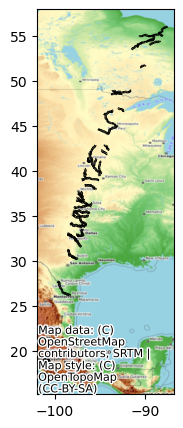

In [15]:
# Simple plot
fig, ax = plt.subplots(figsize=(7,5))
SWOT_HR_shp1.plot(ax=ax, color='black')
cx.add_basemap(ax, crs=SWOT_HR_shp1.crs, source=cx.providers.OpenTopoMap)

In [ ]:
# Another way to plot geopandas dataframes is with `explore`, which also plots a basemap
#SWOT_HR_shp1.explore()

#### **2. Lake Vector Shapefiles**

The lake vector shapefiles can be accessed in the same way as the river shapefiles above.

For additional tips on spatial searching of SWOT HR L2 data, see also [PO.DAAC Cookbook - SWOT Chapter tips section](https://podaac.github.io/tutorials/quarto_text/SWOT.html#tips-for-swot-hr-spatial-search).

#### Search for data of interest

In [16]:
lake_results = earthaccess.search_data(short_name = 'SWOT_L2_HR_LAKESP_2.0', 
                                        temporal = ('2024-02-01 00:00:00', '2024-05-29 23:59:59'), # can also specify by time
                                        granule_name = '*Obs*_009_NA*') # here we filter by files with 'Obs' in the name (This collection has three options: Obs, Unassigned, and Prior), pass #8 and continent code=NA

Granules found: 3


Let's download the first data file! earthaccess.download has a list as the input format, so we need to put brackets around the single file we pass.

In [17]:
earthaccess.download([lake_results[0]], "./data_downloads")

 Getting 1 granules, approx download size: 0.07 GB


QUEUEING TASKS | : 100%|██████████| 1/1 [00:00<00:00, 500.10it/s]
PROCESSING TASKS | : 100%|██████████| 1/1 [00:08<00:00,  8.78s/it]
COLLECTING RESULTS | : 100%|██████████| 1/1 [00:00<?, ?it/s]


['data_downloads\\SWOT_L2_HR_LakeSP_Obs_011_009_NA_20240215T042656_20240215T043840_PIC0_01.zip']

The native format for this data is a .zip file, and we want the .shp file within the .zip file, so we must first extract the data to open it. First, we'll programmatically get the filename we just downloaded, and then extract all data to the `SWOT_downloads` folder.

In [18]:
filename2 = earthaccess.results.DataGranule.data_links(lake_results[0], access='external')
filename2 = filename2[0].split("/")[-1]
filename2

'SWOT_L2_HR_LakeSP_Obs_011_009_NA_20240215T042656_20240215T043840_PIC0_01.zip'

In [19]:
with zipfile.ZipFile(f'data_downloads/{filename2}', 'r') as zip_ref:
    zip_ref.extractall('data_downloads')

Open the shapefile using `geopandas`

In [20]:
filename_shp2 = filename2.replace('.zip','.shp')
filename_shp2

'SWOT_L2_HR_LakeSP_Obs_011_009_NA_20240215T042656_20240215T043840_PIC0_01.shp'

In [21]:
SWOT_HR_shp2 = gpd.read_file(f'data_downloads/{filename_shp2}') 

#view the attribute table
SWOT_HR_shp2

,obs_id,lake_id,overlap,n_overlap,reach_id,time,time_tai,time_str,wse,wse_u,...,load_tidef,load_tideg,pole_tide,dry_trop_c,wet_trop_c,iono_c,xovr_cal_c,lake_name,p_res_id,geometry
0,771190L999991,7710050732,7,1,no_data,7.612865e+08,7.612865e+08,2024-02-15T04:27:46Z,1891.199,0.495,...,-0.007117,-0.006133,0.003102,-1.866600,-0.123063,-0.004111,0.144063,PRESA SOLS,-99999999,"MULTIPOLYGON (((-100.50336 20.05054, -100.5031..."
1,771190L999979,7710050703;7710050672;7710050652;7710050662,87;77;65;59,4,no_data,7.612865e+08,7.612865e+08,2024-02-15T04:27:46Z,1889.682,0.004,...,-0.007199,-0.006219,0.003102,-1.866293,-0.124712,-0.004111,0.219579,PRESA SOLS,1357,"MULTIPOLYGON (((-100.5158 20.05979, -100.51557..."
2,752199L999970,7520013722;7520013783,62;11,2,no_data,7.612866e+08,7.612866e+08,2024-02-15T04:29:25Z,155.554,0.031,...,-0.005442,-0.004708,0.003776,-2.283141,-0.215288,-0.004043,0.071543,no_data,-99999999,"MULTIPOLYGON (((-99.36819 25.60964, -99.36768 ..."
3,752200L999992,7520013712,56,1,no_data,7.612866e+08,7.612866e+08,2024-02-15T04:29:26Z,171.106,0.056,...,-0.005467,-0.004741,0.003785,-2.278423,-0.209456,-0.004044,0.109677,no_data,-99999999,"MULTIPOLYGON (((-99.39502 25.74204, -99.39467 ..."
4,752201L999988,7520010193,85,1,75211000513;75211000503;75211000494,7.612866e+08,7.612866e+08,2024-02-15T04:29:43Z,80.429,0.005,...,-0.005330,-0.004657,0.003886,-2.302238,-0.181897,-0.004057,0.113181,FALCON RESERVOIR;FALCON INTERNATIONAL RESERVOIR,1320,"MULTIPOLYGON (((-99.22037 26.55961, -99.21999 ..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22001,713255R000251,7131518342,96,1,no_data,7.612871e+08,7.612872e+08,2024-02-15T04:38:39Z,6.478,0.033,...,0.011086,0.010793,0.010492,-2.321023,-0.027637,-0.002613,-0.044177,no_data,-99999999,"POLYGON ((-88.03554 56.47205, -88.0351 56.4717..."
22002,713255R000254,7131524462,68,1,no_data,7.612871e+08,7.612872e+08,2024-02-15T04:38:39Z,6.138,0.019,...,0.011330,0.010944,0.010494,-2.321617,-0.027692,-0.002613,-0.050335,no_data,-99999999,"POLYGON ((-88.00525 56.46481, -88.00487 56.464..."
22003,713255R000255,7131518332,87,1,no_data,7.612871e+08,7.612872e+08,2024-02-15T04:38:39Z,4.438,0.032,...,0.011425,0.010960,0.010493,-2.322406,-0.027667,-0.002613,-0.046898,no_data,-99999999,"POLYGON ((-88.02839 56.4764, -88.02796 56.4761..."
22004,713255R000256,7131524362,51,1,no_data,7.612871e+08,7.612872e+08,2024-02-15T04:38:39Z,5.238,0.146,...,0.011330,0.010913,0.010493,-2.321760,-0.027660,-0.002613,-0.046809,no_data,-99999999,"POLYGON ((-88.0222 56.47154, -88.02179 56.4712..."


#### Quickly plot the SWOT lakes data

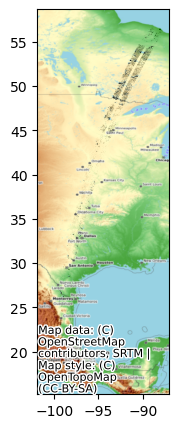

In [22]:
fig, ax = plt.subplots(figsize=(7,5))
SWOT_HR_shp2.plot(ax=ax, color='black')
cx.add_basemap(ax, crs=SWOT_HR_shp2.crs, source=cx.providers.OpenTopoMap)

Accessing the remaining files is different than the shp files above. We do not need to extract the shapefiles from a zip file because the following SWOT HR collections are stored in **netCDF** files in the cloud. For the rest of the products, we will open via `xarray`, not `geopandas`.

#### **3. Water Mask Pixel Cloud NetCDF**

#### Search for data collection and time of interest

In [31]:
pixc_results = earthaccess.search_data(short_name = 'SWOT_L2_HR_PIXC_2.0', 
                                        #temporal = ('2024-02-01 00:00:00', '2024-05-29 23:59:59'), # can also specify by time
                                        bounding_box = (-106.62, 38.809, -106.54, 38.859)) # Lake Travis near Austin, TX

Granules found: 2670


Let's download one data file! earthaccess.download has a list as the input format, so we need to put brackets around the single file we pass.

In [32]:
earthaccess.download([pixc_results[0]], "./data_downloads")

 Getting 1 granules, approx download size: 0.29 GB


QUEUEING TASKS | : 100%|██████████| 1/1 [00:00<00:00, 299.83it/s]
PROCESSING TASKS | : 100%|██████████| 1/1 [00:33<00:00, 33.47s/it]
COLLECTING RESULTS | : 100%|██████████| 1/1 [00:00<?, ?it/s]


['data_downloads\\SWOT_L2_HR_PIXC_566_022_137L_20230629T015538_20230629T015549_PGC0_01.nc']

#### Open data using xarray

The pixel cloud netCDF files are formatted with three groups titled, "pixel cloud", "tvp", or "noise" (more detail [here](https://podaac-tools.jpl.nasa.gov/drive/files/misc/web/misc/swot_mission_docs/pdd/D-56411_SWOT_Product_Description_L2_HR_PIXC_20200810.pdf)). In order to access the coordinates and variables within the file, a group must be specified when calling xarray open_dataset.

In [33]:
ds_PIXC = xr.open_mfdataset("data_downloads/SWOT_L2_HR_PIXC_*.nc", group = 'pixel_cloud', engine='h5netcdf')
ds_PIXC

<xarray.Dataset> Size: 845MB
Dimensions:                                (points: 3060839, complex_depth: 2,
                                            num_pixc_lines: 3257)
Coordinates:
    latitude                               (points) float64 24MB dask.array<chunksize=(510140,), meta=np.ndarray>
    longitude                              (points) float64 24MB dask.array<chunksize=(510140,), meta=np.ndarray>
Dimensions without coordinates: points, complex_depth, num_pixc_lines
Data variables: (12/61)
    azimuth_index                          (points) float64 24MB dask.array<chunksize=(1020280,), meta=np.ndarray>
    range_index                            (points) float64 24MB dask.array<chunksize=(1020280,), meta=np.ndarray>
    interferogram                          (points, complex_depth) float32 24MB dask.array<chunksize=(1020280, 1), meta=np.ndarray>
    power_plus_y                           (points) float32 12MB dask.array<chunksize=(1020280,), meta=np.ndarray>
    power_minus_y                          (points) float32 12MB dask.array<chunksize=(1020280,), meta=np.ndarray>
    coherent_power                         (points) float32 12MB dask.array<chunksize=(1020280,), meta=np.ndarray>
    ...                                     ...
    pixc_line_qual                         (num_pixc_lines) float64 26kB dask.array<chunksize=(3257,), meta=np.ndarray>
    pixc_line_to_tvp                       (num_pixc_lines) float32 13kB dask.array<chunksize=(3257,), meta=np.ndarray>
    data_window_first_valid                (num_pixc_lines) float64 26kB dask.array<chunksize=(3257,), meta=np.ndarray>
    data_window_last_valid                 (num_pixc_lines) float64 26kB dask.array<chunksize=(3257,), meta=np.ndarray>
    data_window_first_cross_track          (num_pixc_lines) float32 13kB dask.array<chunksize=(3257,), meta=np.ndarray>
    data_window_last_cross_track           (num_pixc_lines) float32 13kB dask.array<chunksize=(3257,), meta=np.ndarray>
Attributes:
    description:                 cloud of geolocated interferogram pixels
    interferogram_size_azimuth:  3257
    interferogram_size_range:    5622
    looks_to_efflooks:           1.5410785503365458
    num_azimuth_looks:           7.0
    azimuth_offset:              4

#### For plotting PIXC using classification and quality flags

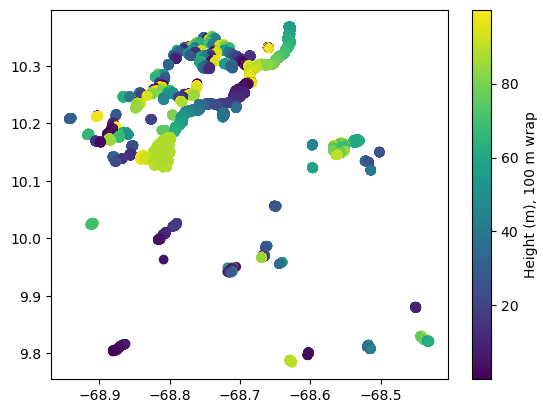

In [63]:
# mask to get good water pixels and wrap height at 100 m
mask = np.where(np.logical_and(ds_PIXC.classification > 2, ds_PIXC.geolocation_qual <4))

plt.scatter(x=ds_PIXC.longitude[mask], y=ds_PIXC.latitude[mask], c=np.mod(ds_PIXC.height[mask], 100))
plt.colorbar().set_label('Height (m), 100 m wrap')

#### **4. Water Mask Pixel Cloud Vector Attribute NetCDF**

#### Search for data of interest

In [56]:
#Let's plot the same pass and tile as the above
pixcvec_results = earthaccess.search_data(short_name = 'SWOT_L2_HR_PIXCVEC_2.0', 
                                          granule_name = '*_022_137L*') #The same pass and tile as previously downloaded

Granules found: 76


Let's download the first data file! earthaccess.download has a list as the input format, so we need to put brackets around the single file we pass.

In [57]:
earthaccess.download([pixcvec_results[0]], "./data_downloads")

 Getting 1 granules, approx download size: 0.0 GB


QUEUEING TASKS | : 100%|██████████| 1/1 [00:00<00:00, 729.44it/s]
PROCESSING TASKS | : 100%|██████████| 1/1 [00:03<00:00,  3.91s/it]
COLLECTING RESULTS | : 100%|██████████| 1/1 [00:00<?, ?it/s]


['data_downloads\\SWOT_L2_HR_PIXCVec_482_022_137L_20230406T150238_20230406T150249_PGC0_01.nc']

#### Open data using xarray

First, we'll programmatically get the filename we just downloaded and then view the file via `xarray`.

In [58]:
ds_PIXCVEC = xr.open_mfdataset("data_downloads/SWOT_L2_HR_PIXCVec_*.nc", decode_cf=False,  engine='h5netcdf')
ds_PIXCVEC

<xarray.Dataset> Size: 203MB
Dimensions:               (points: 2606589, nchar_reach_id: 11,
                           nchar_node_id: 14, nchar_lake_id: 10,
                           nchar_obs_id: 13)
Dimensions without coordinates: points, nchar_reach_id, nchar_node_id,
                                nchar_lake_id, nchar_obs_id
Data variables:
    azimuth_index         (points) int32 10MB dask.array<chunksize=(868863,), meta=np.ndarray>
    range_index           (points) int32 10MB dask.array<chunksize=(868863,), meta=np.ndarray>
    latitude_vectorproc   (points) float64 21MB dask.array<chunksize=(521318,), meta=np.ndarray>
    longitude_vectorproc  (points) float64 21MB dask.array<chunksize=(521318,), meta=np.ndarray>
    height_vectorproc     (points) float32 10MB dask.array<chunksize=(868863,), meta=np.ndarray>
    reach_id              (points, nchar_reach_id) |S1 29MB dask.array<chunksize=(868863, 3), meta=np.ndarray>
    node_id               (points, nchar_node_id) |S1 36MB dask.array<chunksize=(868863, 4), meta=np.ndarray>
    lake_id               (points, nchar_lake_id) |S1 26MB dask.array<chunksize=(868863, 3), meta=np.ndarray>
    obs_id                (points, nchar_obs_id) |S1 34MB dask.array<chunksize=(868863, 4), meta=np.ndarray>
    ice_clim_f            (points) int8 3MB dask.array<chunksize=(2606589,), meta=np.ndarray>
    ice_dyn_f             (points) int8 3MB dask.array<chunksize=(2606589,), meta=np.ndarray>
Attributes: (12/45)
    Conventions:                     CF-1.7
    title:                           Level 2 KaRIn high rate pixel cloud vect...
    short_name:                      L2_HR_PIXCVec
    institution:                     JPL
    source:                          Level 1B KaRIn High Rate Single Look Com...
    history:                         2024-05-23T03:31:32.899185Z: Creation
    ...                              ...
    xref_prior_river_db_file:        
    xref_prior_lake_db_file:         SWOT_LakeDatabase_Cal_022_20000101T00000...
    xref_reforbittrack_files:        SWOT_RefOrbitTrackTileBoundary_Cal_20000...
    xref_param_l2_hr_laketile_file:  SWOT_Param_L2_HR_LakeTile_20000101T00000...
    ellipsoid_semi_major_axis:       6378137.0
    ellipsoid_flattening:            0.0033528106647474805

#### Simple plot

In [59]:
pixcvec_htvals = ds_PIXCVEC.height_vectorproc.compute()
pixcvec_latvals = ds_PIXCVEC.latitude_vectorproc.compute()
pixcvec_lonvals = ds_PIXCVEC.longitude_vectorproc.compute()

#Before plotting, we set all fill values to nan so that the graph shows up better spatially
pixcvec_htvals[pixcvec_htvals > 15000] = np.nan
pixcvec_latvals[pixcvec_latvals == 0] = np.nan
pixcvec_lonvals[pixcvec_lonvals == 0] = np.nan

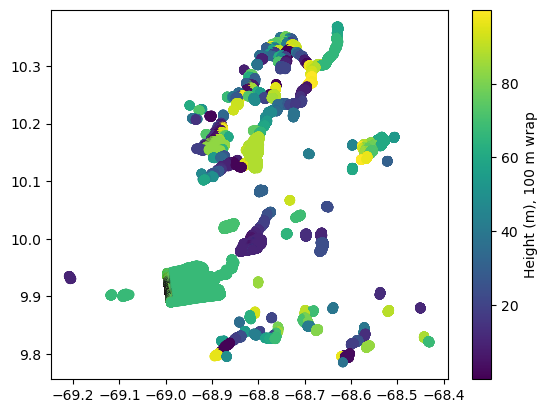

In [62]:
plt.scatter(x=pixcvec_lonvals, y=pixcvec_latvals, c=np.mod(pixcvec_htvals, 100))
plt.colorbar().set_label('Height (m), 100 m wrap')

#### **5. Raster NetCDF**

#### Search for data of interest

In [64]:
raster_results = earthaccess.search_data(short_name = 'SWOT_L2_HR_Raster_2.0', 
                                        #temporal = ('2024-02-01 00:00:00', '2024-02-29 23:59:59'), # can also specify by time
                                        granule_name = '*100m*', # here we filter by files with '100m' in the name (This collection has two resolution options: 100m & 250m)
                                        bounding_box = (-106.62, 38.809, -106.54, 38.859)) # Lake Travis near Austin, TX

Granules found: 187


Let's download one data file.

In [65]:
earthaccess.download([raster_results[0]], "./data_downloads")

 Getting 1 granules, approx download size: 0.06 GB


QUEUEING TASKS | : 100%|██████████| 1/1 [00:00<00:00, 164.79it/s]
PROCESSING TASKS | : 100%|██████████| 1/1 [00:09<00:00,  9.58s/it]
COLLECTING RESULTS | : 100%|██████████| 1/1 [00:00<?, ?it/s]


['data_downloads\\SWOT_L2_HR_Raster_100m_UTM60V_N_x_x_x_001_222_021F_20230729T031016_20230729T031037_PGC0_01.nc']

#### Open data with xarray

First, we'll programmatically get the filename we just downloaded and then view the file via `xarray`.

In [66]:
ds_raster = xr.open_mfdataset(f'data_downloads/SWOT_L2_HR_Raster*', engine='h5netcdf')
ds_raster

<xarray.Dataset> Size: 587MB
Dimensions:                  (x: 1731, y: 1731)
Coordinates:
  * x                        (x) float64 14kB 4.795e+05 4.796e+05 ... 6.525e+05
  * y                        (y) float64 14kB 6.928e+06 6.928e+06 ... 7.101e+06
Data variables: (12/39)
    crs                      object 8B ...
    longitude                (y, x) float64 24MB dask.array<chunksize=(577, 577), meta=np.ndarray>
    latitude                 (y, x) float64 24MB dask.array<chunksize=(577, 577), meta=np.ndarray>
    wse                      (y, x) float32 12MB dask.array<chunksize=(866, 866), meta=np.ndarray>
    wse_qual                 (y, x) float32 12MB dask.array<chunksize=(1731, 1731), meta=np.ndarray>
    wse_qual_bitwise         (y, x) float64 24MB dask.array<chunksize=(866, 866), meta=np.ndarray>
    ...                       ...
    load_tide_fes            (y, x) float32 12MB dask.array<chunksize=(866, 866), meta=np.ndarray>
    load_tide_got            (y, x) float32 12MB dask.array<chunksize=(866, 866), meta=np.ndarray>
    pole_tide                (y, x) float32 12MB dask.array<chunksize=(866, 866), meta=np.ndarray>
    model_dry_tropo_cor      (y, x) float32 12MB dask.array<chunksize=(866, 866), meta=np.ndarray>
    model_wet_tropo_cor      (y, x) float32 12MB dask.array<chunksize=(866, 866), meta=np.ndarray>
    iono_cor_gim_ka          (y, x) float32 12MB dask.array<chunksize=(866, 866), meta=np.ndarray>
Attributes: (12/49)
    Conventions:                   CF-1.7
    title:                         Level 2 KaRIn High Rate Raster Data Product
    institution:                   JPL
    source:                        Ka-band radar interferometer
    history:                       2024-06-14T16:18:52Z : Creation
    platform:                      SWOT
    ...                            ...
    mgrs_latitude_band:            V
    x_min:                         479500.0
    x_max:                         652500.0
    y_min:                         6928300.0
    y_max:                         7101300.0
    product_version:               01

#### Quick interactive plot with `hvplot`

Note: this is not filtered by quality

In [67]:
ds_raster.wse.hvplot.image(y='y', x='x')

:Image   [x,y]   (water surface elevation above geoid)

#### **6. SLC**

#### Search for data collection and time of interest

In [68]:
slc_results = earthaccess.search_data(short_name = 'SWOT_L1B_HR_SLC_2.0', 
                                        #temporal = ('2024-01-01 00:00:00', '2024-01-30 23:59:59'), # can also specify by time
                                        bounding_box = (-106.62, 38.809, -106.54, 38.859)) # Lake Travis near Austin, TX

Granules found: 291


Let's download one data file! earthaccess.download has a list as the input format, so we need to put brackets around the single file we pass.

In [69]:
earthaccess.download([slc_results[0]], "./data_downloads")

 Getting 1 granules, approx download size: 2.25 GB


QUEUEING TASKS | : 100%|██████████| 1/1 [00:00<00:00, 113.65it/s]
PROCESSING TASKS | : 100%|██████████| 1/1 [04:44<00:00, 284.14s/it]
COLLECTING RESULTS | : 100%|██████████| 1/1 [00:00<?, ?it/s]


['data_downloads\\SWOT_L1B_HR_SLC_566_022_137L_20230629T015538_20230629T015549_PGC0_01.nc']

#### Open data using xarray
The L1B_HR_SLC product file contains five NetCDF data group called the slc, xfactor, noise, tvp, and grdem groups. More info can be found in the [product description document within the dataset table](https://podaac.jpl.nasa.gov/SWOT?tab=datasets) for each group.

In [70]:
ds_SLC = xr.open_mfdataset("data_downloads/SWOT_L1B_HR_SLC*.nc", group = 'slc', engine='h5netcdf')
ds_SLC

<xarray.Dataset> Size: 2GB
Dimensions:      (num_lines: 22804, num_pixels: 5622, complex_depth: 2)
Dimensions without coordinates: num_lines, num_pixels, complex_depth
Data variables:
    slc_plus_y   (num_lines, num_pixels, complex_depth) float32 1GB dask.array<chunksize=(3258, 804, 1), meta=np.ndarray>
    slc_minus_y  (num_lines, num_pixels, complex_depth) float32 1GB dask.array<chunksize=(3258, 804, 1), meta=np.ndarray>
    slc_qual     (num_lines) float32 91kB dask.array<chunksize=(22804,), meta=np.ndarray>
Attributes:
    description:  Single look complex images for plus_y and minus_y channels

#### Plot SLC data

In [71]:
# function to get interferogram from slc images

def interfere(slc):
    # convert to complex array
    slc_plus_y = slc.slc_plus_y[:,:,0] + 1j * slc.slc_plus_y[:,:,1]
    slc_minus_y = slc.slc_minus_y[:,:,0] + 1j * slc.slc_minus_y[:,:,1]
    # get interferogram quantities
    ifgram = slc_plus_y * np.conj(slc_minus_y)
    mag = np.abs(ifgram)
    phase = np.arctan2(np.imag(ifgram), np.real(ifgram))
    return ifgram, np.real(np.abs(slc_plus_y)), np.real(np.abs(slc_minus_y)), mag, phase

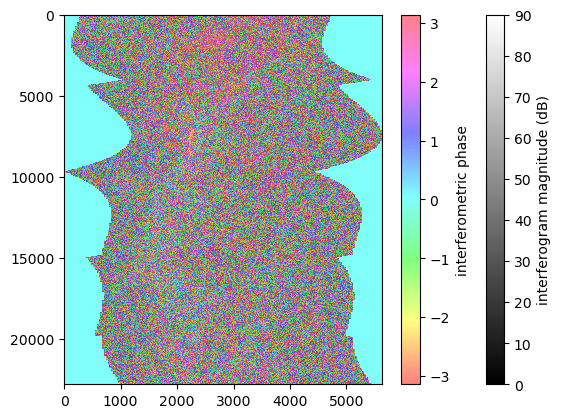

In [72]:
# ignore the divide-by-zero warning in log10
import warnings
warnings.filterwarnings("ignore")

# make a plot of slc interferogram
ifgram, power_plus_y, power_minus_y, mag, phase = interfere(ds_SLC)
plt.imshow(10*np.log10(np.abs(ifgram)), interpolation='none', cmap='gray', aspect='auto')
plt.clim((0,90))
plt.colorbar().set_label('interferogram magnitude (dB)')
plt.imshow(phase, interpolation='none', cmap='hsv', alpha=0.5, aspect='auto')
plt.colorbar().set_label('interferometric phase')

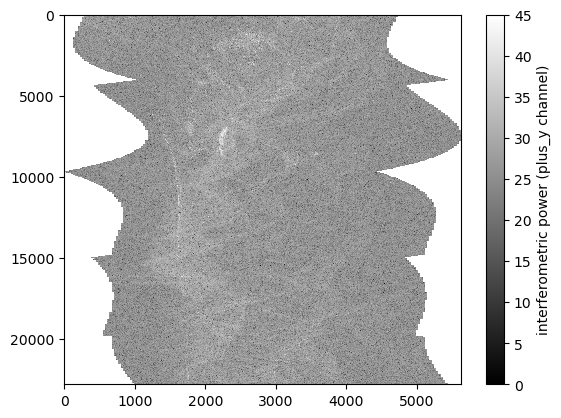

In [73]:
# also plot just the power image
plt.imshow(10*np.log10(power_plus_y), interpolation='none', cmap='gray', aspect='auto')
plt.clim((0,45))
plt.colorbar().set_label('interferometric power (plus_y channel)')